In [92]:
import xarray as xr
import numpy as np
from scipy import stats
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from pathlib import Path
import datetime
from string import ascii_lowercase, ascii_uppercase

from aostools import climate
from cmap import Colormap


In [1]:
from dask.distributed import LocalCluster

# https://forum.access-hive.org.au/t/netcdf-not-a-valid-id-errors/389/12
cluster = LocalCluster(threads_per_worker=1)          # Fully-featured local Dask cluster
client = cluster.get_client()
client

/hpx/Data_impb/kales/conda/envs/myenv/lib/python3.11/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 42385 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:42385/status,
Dashboard: http://127.0.0.1:42385/status,Workers: 56
Total threads: 56,Total memory: 755.78 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40879,Workers: 56
Dashboard: http://127.0.0.1:42385/status,Total threads: 56
Started: Just now,Total memory: 755.78 GiB
Comm: tcp://127.0.0.1:41975,Total threads: 1
Dashboard: http://127.0.0.1:45463/status,Memory: 13.50 GiB
Nanny: tcp://127.0.0.1:34275,


In [3]:
xr.set_options(keep_attrs=True)
infile_path = Path("/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/")
plt.rcParams.update({"font.size": 22})

In [38]:
def xr_multipletest(p, alpha=0.05, method="fdr_bh", **multipletests_kwargs):
    """Apply statsmodels.stats.multitest.multipletests for multi-dimensional xr.objects."""
    from statsmodels.stats.multitest import multipletests

    # stack all to 1d array
    p_stacked = p.stack(s=p.dims)
    # mask only where not nan: https://github.com/statsmodels/statsmodels/issues/2899
    mask = np.isfinite(p_stacked)
    pvals_corrected = np.full(p_stacked.shape, np.nan)
    reject = np.full(p_stacked.shape, np.nan)
    # apply test where mask
    reject[mask] = multipletests(
        p_stacked[mask], alpha=alpha, method=method, **multipletests_kwargs
    )[0]
    pvals_corrected[mask] = multipletests(
        p_stacked[mask], alpha=alpha, method=method, **multipletests_kwargs
    )[1]

    def unstack(reject, p_stacked):
        """Exchange values from p_stacked with reject (1d array) and unstack."""
        xreject = p_stacked.copy()
        xreject.values = reject
        xreject = xreject.unstack()
        return xreject

    reject = unstack(reject, p_stacked)
    pvals_corrected = unstack(pvals_corrected, p_stacked)
    return reject, pvals_corrected

def process_tpp(ds, deseasonalize=True, upper_limit=1, lower_limit=300):
    ds = ds.drop_vars(["var152", "time_bnds", "lat_bnds"], errors="ignore")
    ds["time"] = pd.date_range("2021-01", freq="M", periods=ds.time.shape[0])
    ds = ds.rename({"var237": "tpp"})
    ds["tpp"] = ds["tpp"] / 100.0

    ds["tpp"].attrs["units"] = "hPa"
    ds["tpp"].attrs["long_name"] = "tropopause pressure"
    # ds["plev"].attrs["standard_name"] = "pressure"

    if deseasonalize:
        ds = anomalize_func(ds)  # deseasonalize_func(ds)

    return ds

def add_div(ds):
    ds_out = ds['div1']+ds['div2']
    return ds_out

In [5]:
what = "tropopause-daily"
infiles_w = list(infile_path.glob(f"socol4_htt1*{what}*"))
infiles_wo = list(infile_path.glob(f"socol4_htt2*{what}*"))
infiles_w

[PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt18_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt14_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt12_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt19_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt15_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt13_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt16_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt10_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt17_tropopause-daily_2021-2025.nc'),
 PosixPath('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4

In [9]:
ds_w_tpp = (
    xr.open_mfdataset(
        infiles_w,
        parallel=True,  #  will be performed in parallel using dask.delayed
        combine="nested",
        concat_dim=["ens"],
    )
    .pipe(process_tpp, deseasonalize=False)
    #.load()
)
ds_w_tpp

/tmp/ipykernel_20763/1137116062.py:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ds["time"] = pd.date_range("2021-01", freq="M", periods=ds.time.shape[0])


<xarray.Dataset> Size: 1GB
Dimensions:  (time: 1826, lon: 192, lat: 96, ens: 10)
Coordinates:
  * time     (time) datetime64[ns] 15kB 2021-01-31 2021-02-28 ... 2173-02-28
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 768B 88.57 86.72 84.86 83.0 ... -84.86 -86.72 -88.57
Dimensions without coordinates: ens
Data variables:
    tpp      (ens, time, lat, lon) float32 1GB dask.array<chunksize=(1, 1826, 96, 192), meta=np.ndarray>
Attributes:
    CDI:          Climate Data Interface version 1.9.10 (https://mpimet.mpg.d...
    Conventions:  CF-1.6
    institution:  Max Planck Institute for Meteorology
    history:      Fri May 10 15:31:40 2024: cdo cat ttsocol4_htt181.nc /scrat...
    CDO:          Climate Data Operators version 1.9.10 (https://mpimet.mpg.d...

In [10]:
ds_wo_tpp = (
    xr.open_mfdataset(
        infiles_wo,
        parallel=True,  #  will be performed in parallel using dask.delayed
        combine="nested",
        concat_dim=["ens"],
    )
    .pipe(process_tpp, deseasonalize=False)
    .load()
)
ds_wo_tpp

/tmp/ipykernel_13952/1137116062.py:32: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ds["time"] = pd.date_range("2021-01", freq="M", periods=ds.time.shape[0])


<xarray.Dataset> Size: 1GB
Dimensions:  (time: 1826, lon: 192, lat: 96, ens: 10)
Coordinates:
  * time     (time) datetime64[ns] 15kB 2021-01-31 2021-02-28 ... 2173-02-28
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 768B 88.57 86.72 84.86 83.0 ... -84.86 -86.72 -88.57
Dimensions without coordinates: ens
Data variables:
    tpp      (ens, time, lat, lon) float32 1GB nan nan nan ... 269.5 270.2 270.8
Attributes:
    CDI:          Climate Data Interface version 1.9.10 (https://mpimet.mpg.d...
    Conventions:  CF-1.6
    institution:  Max Planck Institute for Meteorology
    history:      Fri May 10 15:31:52 2024: cdo cat ttsocol4_htt261.nc /scrat...
    CDO:          Climate Data Operators version 1.9.10 (https://mpimet.mpg.d...

In [18]:
ds_w = xr.open_dataset('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt1-all_ta-ua-va_2023-JFMA.nc', chunks = dict(ens = 1, time = 120))
ds_w

/hpx/Data_impb/kales/conda/envs/myenv/lib/python3.11/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "ens" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


<xarray.Dataset> Size: 12GB
Dimensions:  (ens: 10, time: 120, plev: 47, lat: 96, lon: 192)
Coordinates:
  * time     (time) datetime64[ns] 960B 2023-01-01 2023-01-02 ... 2023-04-30
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 768B -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * plev     (plev) float64 376B 0.009946 0.04281 0.1112 ... 995.4 1.009e+03
Dimensions without coordinates: ens
Data variables:
    t        (ens, time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 120, 24, 48, 96), meta=np.ndarray>
    u        (ens, time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 120, 24, 48, 96), meta=np.ndarray>
    v        (ens, time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 120, 24, 48, 96), meta=np.ndarray>
Attributes:
    CDI:          Climate Data Interface version 1.9.10 (https://mpimet.mpg.d...
    Conventions:  CF-1.6
    institution:  Max Planck Institute for Meteorology
    history:      Thu Mar 28 16:15:52 2024: cdo cat Postproc_example-va-paral...
    CDO:          Climate Data Operators version 1.9.10 (https://mpimet.mpg.d...

In [19]:
ds_wo = xr.open_dataset('/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/socol4_htt2-all_ta-ua-va_2023-JFMA.nc', chunks = dict(ens = 1, time = 120))
ds_wo

/hpx/Data_impb/kales/conda/envs/myenv/lib/python3.11/site-packages/xarray/core/dataset.py:271: UserWarning: The specified chunks separate the stored chunks along dimension "ens" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


<xarray.Dataset> Size: 12GB
Dimensions:  (ens: 10, time: 120, plev: 47, lat: 96, lon: 192)
Coordinates:
  * time     (time) datetime64[ns] 960B 2023-01-01 2023-01-02 ... 2023-04-30
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * lat      (lat) float64 768B -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * plev     (plev) float64 376B 0.009946 0.04281 0.1112 ... 995.4 1.009e+03
Dimensions without coordinates: ens
Data variables:
    t        (ens, time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 120, 24, 48, 96), meta=np.ndarray>
    u        (ens, time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 120, 24, 48, 96), meta=np.ndarray>
    v        (ens, time, plev, lat, lon) float32 4GB dask.array<chunksize=(1, 120, 24, 48, 96), meta=np.ndarray>
Attributes:
    CDI:          Climate Data Interface version 1.9.10 (https://mpimet.mpg.d...
    Conventions:  CF-1.6
    institution:  Max Planck Institute for Meteorology
    history:      Thu Mar 28 16:16:11 2024: cdo cat Postproc_example-va-paral...
    CDO:          Climate Data Operators version 1.9.10 (https://mpimet.mpg.d...

In [33]:
time_slice = slice("2022-12-30", "2023-05")
temp = ds_w.sel(time = time_slice)
ep_diags_w = climate.ComputeEPfluxDivXr(temp['u'], temp['v'], temp['t'], pres = 'plev')

temp = ds_wo.sel(time = time_slice)
ep_diags_wo = climate.ComputeEPfluxDivXr(temp['u'], temp['v'], temp['t'], pres = 'plev')


In [36]:
ep_ds_w = xr.merge(ep_diags_w).load()
ep_ds_wo = xr.merge(ep_diags_wo).load()

In [69]:
diff_ep1 = ep_ds_w['ep1'].mean('ens')-ep_ds_wo['ep1'].mean('ens')
diff_ep2 = ep_ds_w['ep2'].mean('ens')-ep_ds_wo['ep2'].mean('ens')

In [49]:
epfd_w = add_div(ep_ds_w)
epfd_wo = add_div(ep_ds_wo)

In [50]:
diff_epfd = epfd_w.mean("ens") - epfd_wo.mean("ens") # high latitudes
diff_epfd

<xarray.DataArray (time: 120, plev: 47, lat: 96)> Size: 4MB
array([[[ 3.31016015e-01,  3.92637651e-01,  3.59995955e-01, ...,
          3.86945926e+00,  1.60086895e+00, -1.00536029e-01],
        [ 1.09326274e+00,  1.12940856e+00,  6.94546791e-01, ...,
          5.43435289e+00,  3.35653826e+00,  1.85543216e+00],
        [ 1.10782928e-01,  2.50260149e-01,  3.01703557e-01, ...,
          7.84122609e+00,  5.87468880e+00,  2.84467123e+00],
        ...,
        [            nan,             nan,             nan, ...,
         -1.42737354e+01, -8.73402805e+00, -4.28711724e+00],
        [            nan,             nan,             nan, ...,
         -1.94093302e+01,  3.97139299e+00, -7.19489102e-01],
        [            nan,             nan,             nan, ...,
         -2.03110610e+01,  3.01551570e+01,  8.17088505e+00]],

       [[ 4.29619586e-02,  2.30549841e-01,  2.96398354e-01, ...,
          2.89932295e+00,  3.87543304e+00,  2.59402990e+00],
        [ 4.96635695e-01,  7.34737577e-01,  6.87844648e-01, ...,
          2.35209850e+00,  6.21180238e+00,  7.37671720e+00],
        [ 5.66450342e-02,  4.10215406e-01,  6.39111472e-01, ...,
          5.01407738e+00,  1.97609335e+00, -6.11645356e-01],
...
        [            nan,             nan,             nan, ...,
         -3.45869233e+00,  3.14065351e-01,  1.04596508e+00],
        [            nan,             nan,             nan, ...,
         -2.36382846e+00, -5.73461208e+00, -4.41117846e+00],
        [            nan,             nan,             nan, ...,
          7.07202092e+00, -1.97148739e+01, -1.03116005e+01]],

       [[-1.13753806e+00, -3.49538804e-01,  8.22982004e-01, ...,
          4.79548479e-01,  6.58048948e-02, -4.36151342e-01],
        [ 1.43056898e+00,  1.77455513e+00,  1.61374653e+00, ...,
          2.16891144e+00,  2.23396241e+00,  1.50474631e+00],
        [ 5.60135469e-01,  2.52130942e+00,  3.86603036e+00, ...,
          7.82596047e-01, -1.40293170e-01, -9.29923102e-01],
        ...,
        [            nan,             nan,             nan, ...,
         -3.17763297e+00, -8.17333976e-01,  1.63478915e+00],
        [            nan,             nan,             nan, ...,
         -8.63773871e+00, -9.81689695e+00, -1.02930730e+01],
        [            nan,             nan,             nan, ...,
         -1.18992448e+01, -1.50963650e+01, -2.21576757e+01]]])
Coordinates:
  * time     (time) datetime64[ns] 960B 2023-01-01 2023-01-02 ... 2023-04-30
  * lat      (lat) float64 768B -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * plev     (plev) float64 376B 0.009946 0.04281 0.1112 ... 995.4 1.009e+03
Attributes:
    long_name:      latitude
    axis:           Y
    standard_name:  latitude
    units:          degrees_north

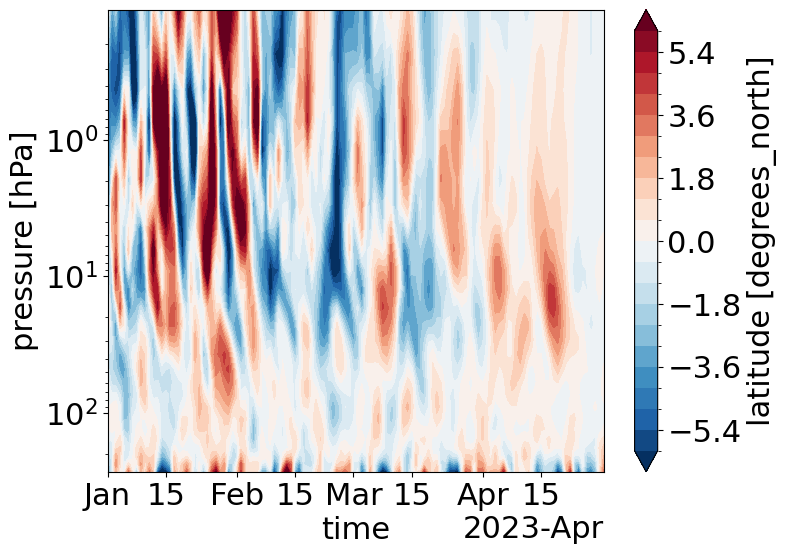

In [62]:
diff_epfd.sel(lat = slice(45,75),  plev = slice(0.1,300)).weighted(weights).mean('lat').plot.contourf(x = 'time', yincrease = False, robust = True, levels = 21, size = 6)
plt.yscale('log')

In [131]:
diff_u = ds_w['u'].sel(**sel_dict).mean(['ens','lon'])-ds_wo['u'].sel(**sel_dict).mean(['ens','lon'])
diff_u

<xarray.DataArray 'u' (plev: 28, lat: 48)> Size: 5kB
dask.array<sub, shape=(28, 48), dtype=float32, chunksize=(24, 48), chunktype=numpy.ndarray>
Coordinates:
    time     datetime64[ns] 8B 2023-03-31
  * lat      (lat) float64 384B 0.9326 2.798 4.663 6.528 ... 84.86 86.72 88.57
  * plev     (plev) float64 224B 0.009946 0.04281 0.1112 ... 208.7 238.3 270.1
Attributes:
    long_name:         u-velocity
    units:             m/s
    code:              131
    table:             128
    CDI_grid_type:     gaussian
    CDI_grid_num_LPE:  48

In [165]:
start_letter = 'a'
end_letter = 'z'
letter_ls = [chr(i).upper() for i in range(ord(start_letter),ord(end_letter)+1)]
greek_letterz=[chr(code) for code in range(945,970)]
all_leters = letter_ls+greek_letterz
all_leters

['A',
 'B',
 'C',
 'D',
 'E',
 'F',
 'G',
 'H',
 'I',
 'J',
 'K',
 'L',
 'M',
 'N',
 'O',
 'P',
 'Q',
 'R',
 'S',
 'T',
 'U',
 'V',
 'W',
 'X',
 'Y',
 'Z',
 'α',
 'β',
 'γ',
 'δ',
 'ε',
 'ζ',
 'η',
 'θ',
 'ι',
 'κ',
 'λ',
 'μ',
 'ν',
 'ξ',
 'ο',
 'π',
 'ρ',
 'ς',
 'σ',
 'τ',
 'υ',
 'φ',
 'χ',
 'ψ',
 'ω']

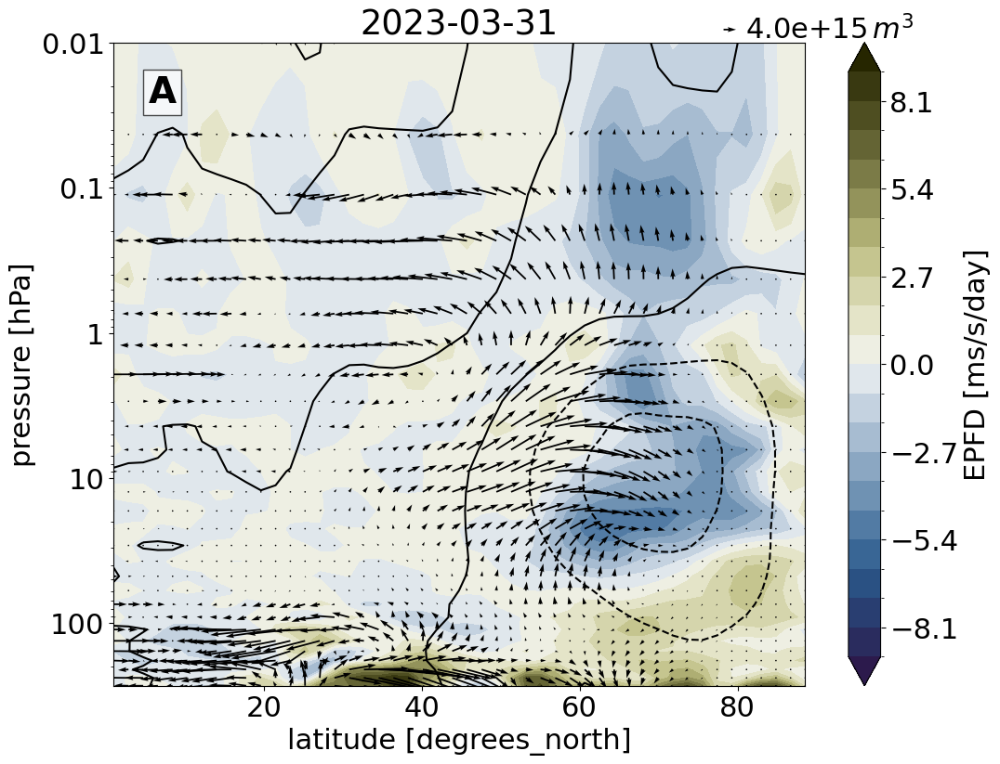

In [140]:
fig, ax = plt.subplots(figsize = (12,9))
sel_time = f'2023-03-{i:02d}'
#print(sel_time)
sel_dict = dict(plev = slice(None,300), lat = slice(0,None), time = sel_time)
ep1 = diff_ep1.sel(**sel_dict)
ep2 = diff_ep2.sel(**sel_dict)

lats = ep1.lat
plevs = ep1.plev

diff_u = ds_w['u'].sel(**sel_dict).mean(['ens','lon'])-ds_wo['u'].sel(**sel_dict).mean(['ens','lon'])
diff_u.plot.contour(ax = ax, colors = ('k'))

p = diff_epfd.sel(**sel_dict).plot.contourf(yincrease = True, levels = 21, vmax = 9, extend = 'both', ax=ax, cmap=cmap, cbar_kwargs = dict(label = 'EPFD [ms/s/day]'))
ax.set_title(sel_time)
#ax.set_yscale('log')
Fphi,Fp = climate.PlotEPfluxArrows(lats,plevs,ep1,ep2,fig,ax,xlim=None,ylim=None,xscale='linear',yscale='log',invert_y=True, newax=False, pivot='tail',scale=None,quiv_args=None)

ax.text(
        0.05,
        0.95,
        ascii_uppercase[0],#f'{sel_var[:-2]} ({label})',
        transform=ax.transAxes,
        fontsize=28,
        fontweight="bold",
        va="top",
        bbox={"alpha": 0.7, "facecolor": "white"},
    )
fmt = mpl.ticker.FormatStrFormatter("%g")
ax.yaxis.set_major_formatter(fmt)

/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-01.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-02.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-03.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-04.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-05.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-06.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-07.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-08.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-09.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-10.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-11.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-12.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-13.pdf
/sto0/data/I

/tmp/ipykernel_20763/3190501225.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (12,9))


/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-21.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-22.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-23.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-24.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-25.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-26.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-27.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-28.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-29.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-30.pdf
/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-31.pdf


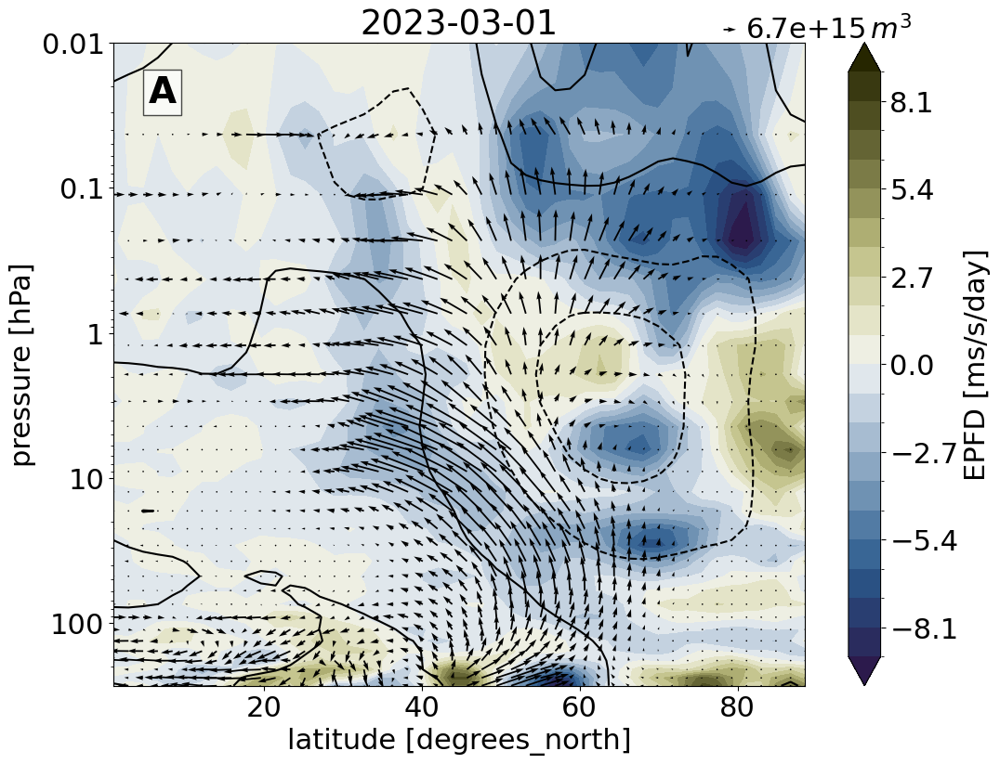

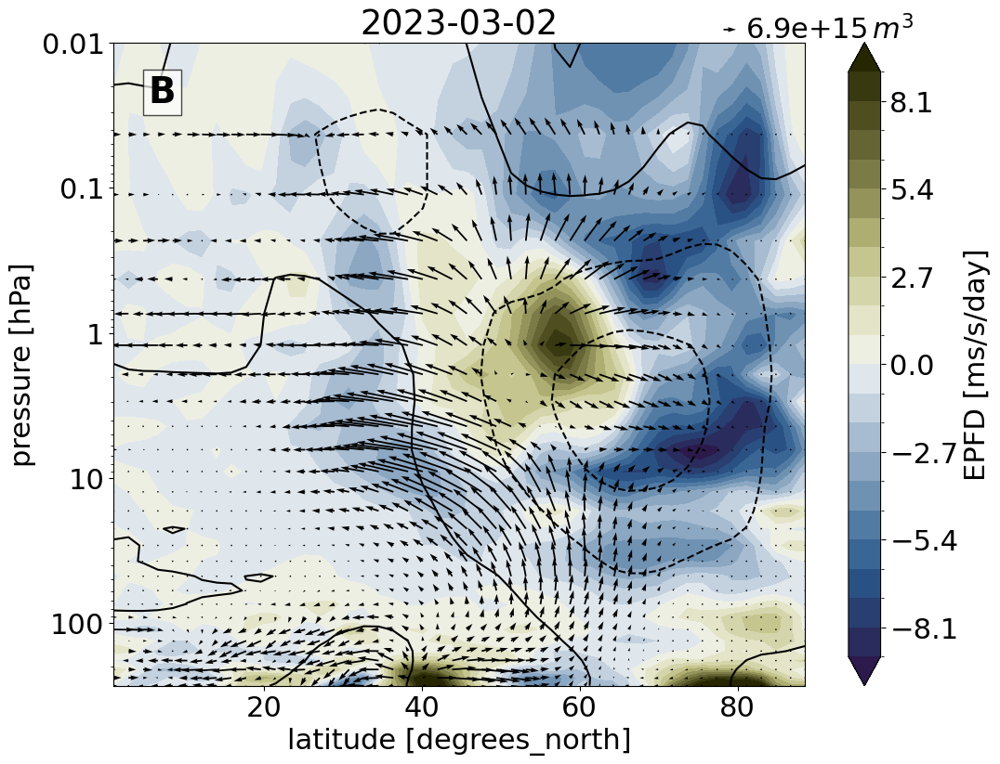

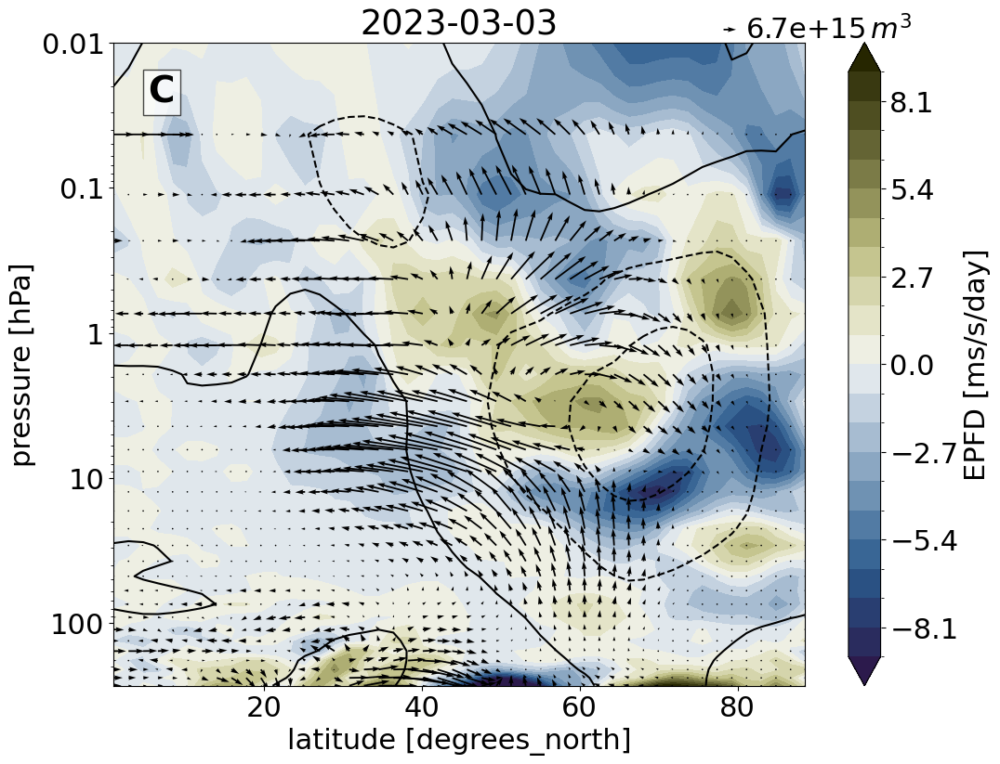

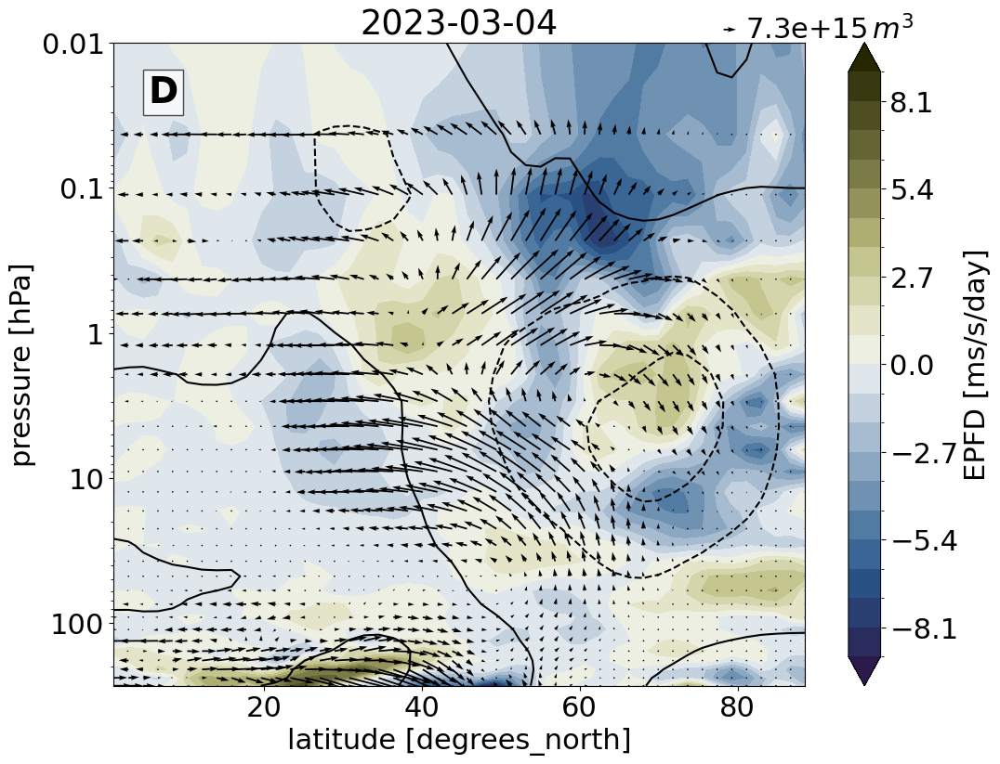

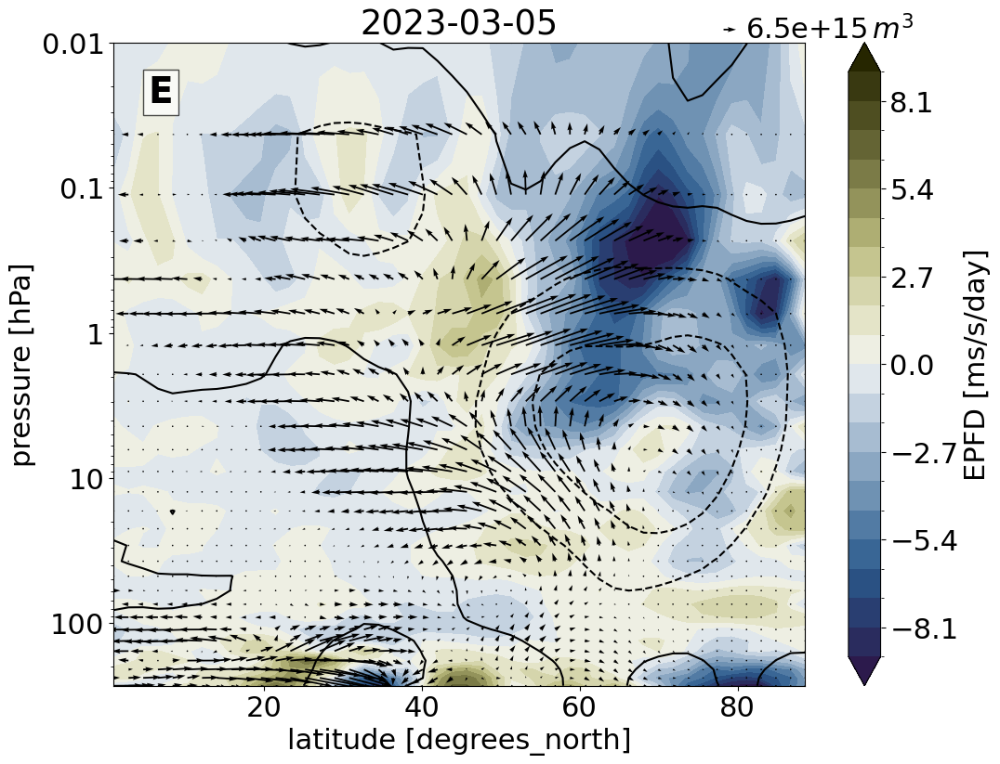

...

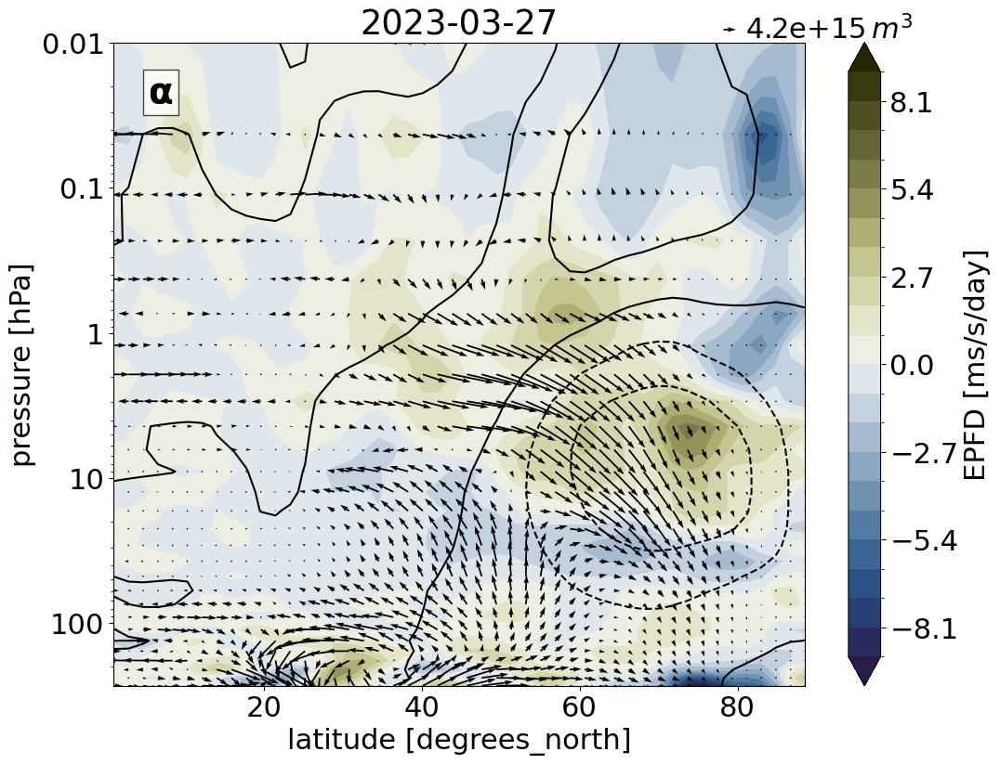

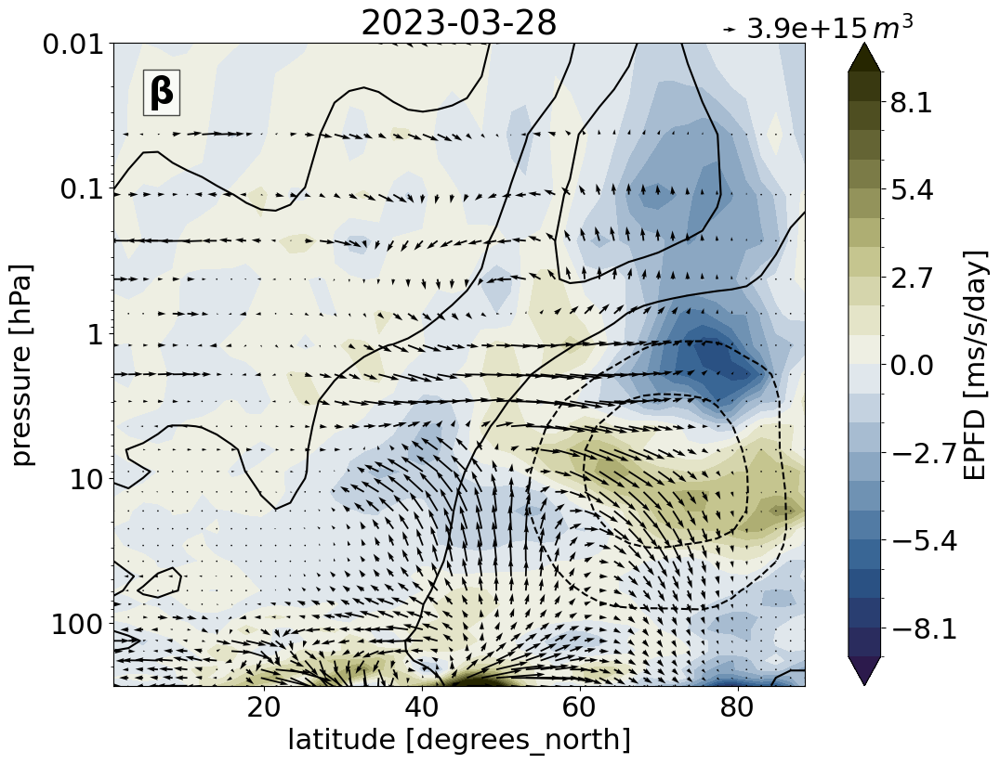

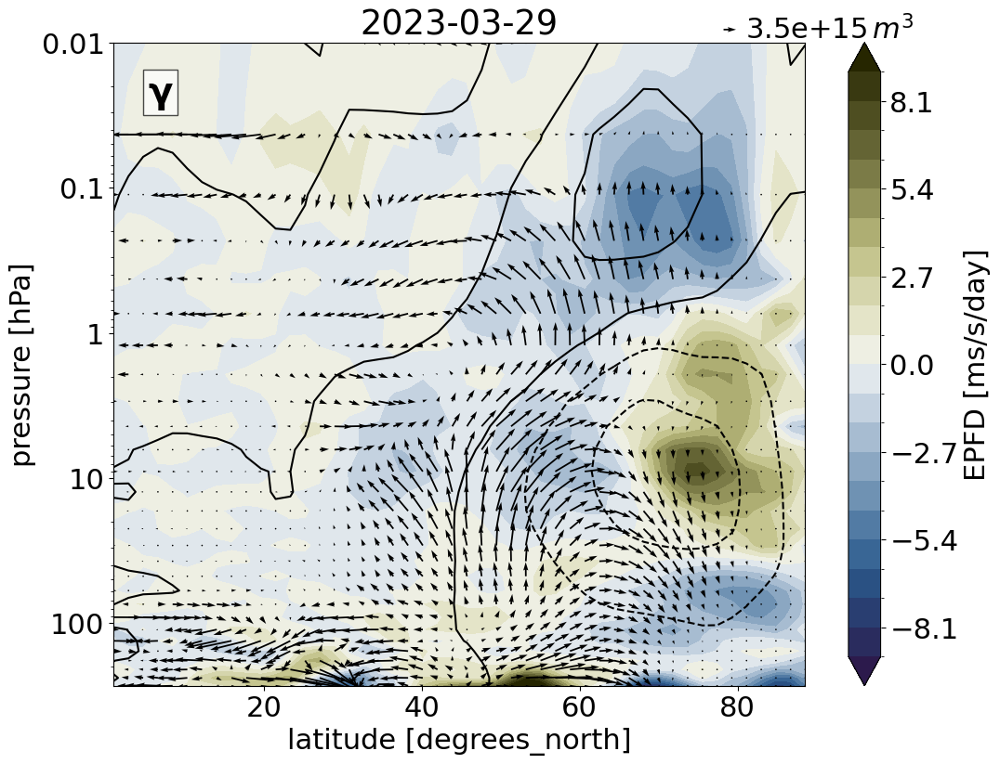

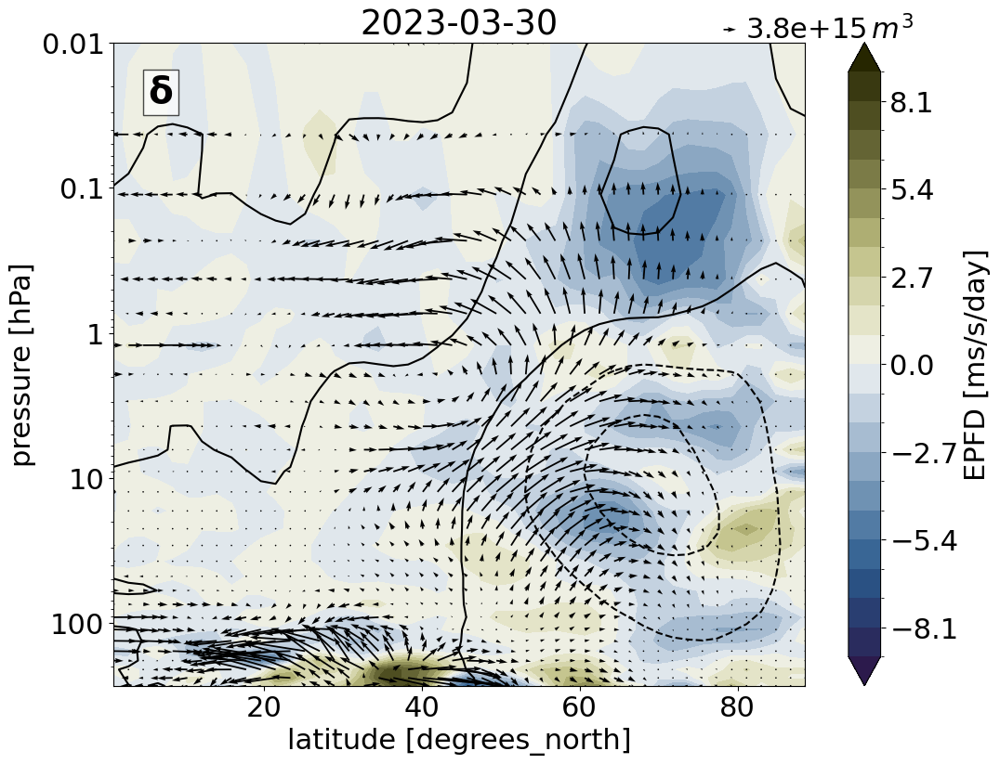

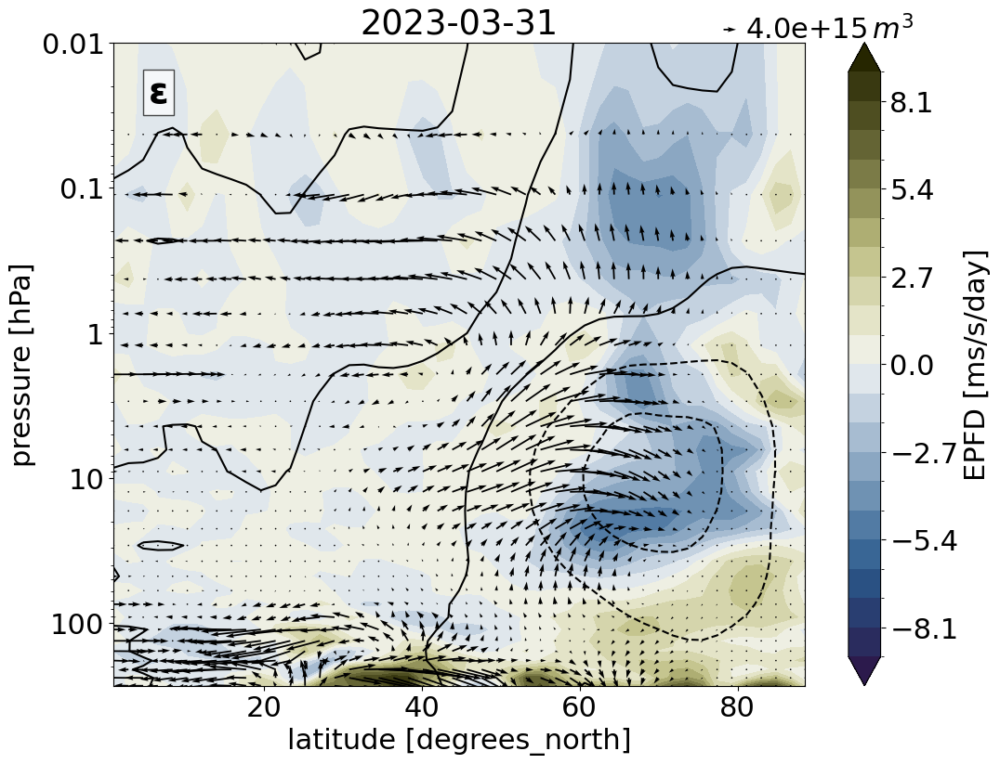

In [163]:
cmap="PuOr_r"
cmap = 'RdGy_r'
cm = Colormap('crameri:broc')#'crameri:vik')
cmap=cm.to_matplotlib()

outpath = '/sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/'
for i,label in zip(range(1,32), all_leters): # ascii_uppercase
    fig, ax = plt.subplots(figsize = (12,9))
    sel_time = f'2023-03-{i:02d}'
    #print(sel_time)
    sel_dict = dict(plev = slice(None,300), lat = slice(0,None), time = sel_time)
    ep1 = diff_ep1.sel(**sel_dict)
    ep2 = diff_ep2.sel(**sel_dict)
    
    lats = ep1.lat
    plevs = ep1.plev

    diff_u = ds_w['u'].sel(**sel_dict).mean(['ens','lon'])-ds_wo['u'].sel(**sel_dict).mean(['ens','lon'])
    diff_u.plot.contour(ax = ax, colors = ('k'))
    
    p = diff_epfd.sel(**sel_dict).plot.contourf(yincrease = True, levels = 21, vmax = 9, extend = 'both', ax=ax, cmap=cmap, cbar_kwargs = dict(label = 'EPFD [ms/s/day]'))
    ax.set_title(sel_time)
    #ax.set_yscale('log')
    Fphi,Fp = climate.PlotEPfluxArrows(lats,plevs,ep1,ep2,fig,ax,xlim=None,ylim=None,xscale='linear',yscale='log',invert_y=True, newax=False, pivot='tail',scale=None,quiv_args=None)

    ax.text(
            0.05,
            0.95,
            label,#ascii_uppercase[j],#f'{sel_var[:-2]} ({label})',
            transform=ax.transAxes,
            fontsize=28,
            fontweight="bold",
            va="top",
            bbox={"alpha": 0.7, "facecolor": "white"},
        )
    fmt = mpl.ticker.FormatStrFormatter("%g")
    ax.yaxis.set_major_formatter(fmt)
    
    outfile = f"{outpath}EPFD_plot_{sel_time}.pdf"
    print(outfile)
    plt.savefig(outfile, bbox_inches="tight")



In [166]:
!pdftk /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03*.pdf output EPFD_plot_2023-March.pdf

In [167]:
!pdfnup --nup 5x6 EPFD_plot_2023-March.pdf 1-30

          ----
  pdfjam: This is pdfjam version 2.08.
  pdfjam: Reading any site-wide or user-specific defaults...
          (none found)
  pdfjam: Effective call for this run of pdfjam:
          /usr/bin/pdfjam --suffix nup --nup '2x1' --landscape --nup '5x6' -- EPFD_plot_2023-March.pdf 1-30 
  pdfjam: Calling pdflatex...
  pdfjam: Finished.  Output was to '/home/kales/notebooks/ht/EPFD_plot_2023-March-1-30-nup.pdf'.


In [168]:
!pdfcrop EPFD_plot_2023-March-1-30-nup.pdf

PDFCROP 1.38, 2012/11/02 - Copyright (c) 2002-2012 by Heiko Oberdiek.
==> 1 page written on `EPFD_plot_2023-March-1-30-nup-crop.pdf'.


In [135]:
!pdfjam /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03*.pdf --nup 5x6 --output  EPFD_plot_2023-March_gallery.pdf

          ----
  pdfjam: This is pdfjam version 2.08.
  pdfjam: Reading any site-wide or user-specific defaults...
          (none found)
  pdfjam: Effective call for this run of pdfjam:
          /usr/bin/pdfjam --nup '5x6' --output 'EPFD_plot_2023-March_gallery.pdf' -- /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-01.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-02.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-03.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-04.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-05.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-06.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-07.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-08.pdf - /sto0/data/Intermediate/Hunga_Tonga_byAles/ht/figs/EPFD_plot_2023-03-09.pdf - /sto0/data/Intermediate/Hu